In [1]:
from shapely.geometry import Point
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import folium
from folium.plugins import MarkerCluster
from folium.plugins import FastMarkerCluster

In [2]:
#read in zipcode data in case it is needed on the map and remove unneeded columns. Also check the data:

zipcodes = gpd.read_file('../data/Zip Codes.geojson')
zipcodes = zipcodes [['zip', 'po_name', 'geometry']]
print(zipcodes.shape)
print(zipcodes.crs)
zipcodes.head( )

(57, 3)
epsg:4326


,zip,po_name,geometry
0,37115,MADISON,"MULTIPOLYGON (((-86.68725 36.31821, -86.68722 ..."
1,37216,NASHVILLE,"MULTIPOLYGON (((-86.73451 36.23774, -86.73425 ..."
2,37204,NASHVILLE,"MULTIPOLYGON (((-86.77914 36.13424, -86.77923 ..."
3,37027,BRENTWOOD,"MULTIPOLYGON (((-86.81258 36.06319, -86.81263 ..."
4,37064,FRANKLIN,"MULTIPOLYGON (((-87.02197 36.01200, -87.02140 ..."


In [3]:
#read in derecho cadd and calls datasets and check them:

cadd_derecho = pd.read_csv('../data/Computer_Aided_Dispatch_Data_Derecho_Incidents_050320_050420.csv', skiprows=3)
calls_derecho = pd.read_csv('../data/911_Phone Calls_Derecho_050320_050420.csv')

print(cadd_derecho.info())
cadd_derecho.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 627 entries, 0 to 626
Data columns (total 5 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   IncidentDate              627 non-null    object 
 1   Location                  627 non-null    object 
 2   Latitude1                 627 non-null    float64
 3   Longitude1                627 non-null    float64
 4   IncidentTypeDescription1  627 non-null    object 
dtypes: float64(2), object(3)
memory usage: 24.6+ KB
None


,IncidentDate,Location,Latitude1,Longitude1,IncidentTypeDescription1
0,5/3/2020 4:31:07 PM,901 KENWICK CT W,36.046877,-86.962526,ELECTRICAL HAZARD
1,5/3/2020 4:32:18 PM,8036 ARBOR DR,36.082491,-86.940680,ELECTRICAL HAZARD
2,5/3/2020 4:32:23 PM,119 DUE WEST AV E,36.248029,-86.716875,NOT ALERT COPD
3,5/3/2020 4:33:04 PM,630 GALLATIN PKE S,36.256491,-86.714817,ABDOMINAL PAIN
4,5/3/2020 4:33:52 PM,615 W HILLWOOD DR,36.129690,-86.879834,ELECTRICAL HAZARD


In [4]:
cadd_derecho.IncidentTypeDescription1.value_counts().head(20)

ELECTRICAL HAZARD                              370
GENERAL ALARM COMMERCIAL   INDUSTRIAL BUILD     23
MVA INJURIES:                                    8
SMALL OUTSIDE FIRE                               6
UNKNOWN STATUS:                                  6
CARBON MONOXIDE ALARM HOUSE                      6
SMALL BUILDING INVESTIGATION                     6
GENERAL ALARM APARTMENT                          5
DIFFICULTY SPEAKING BETWEEN BREATHS COPD         5
SMOKE DETECTOR ALARM HOUSE                       5
ELECTRICAL HAZARD - WIRES DOWN                   5
RESIDENTIAL FIRE                                 4
ENTRAPMENT UNKNOWN SITUATION                     4
UNKNOWN STATUS                                   4
SICK PERSON: ABNORMAL BREATHING                  4
MVA OTHER HAZARDS                                4
SICK PERSON: ALTERED LEVEL OF CONSCIOUSNESS      4
DIFFICULTY SPEAKING BETWEEN BREATHS              4
ENTRAPMENT / TRAPPED                             4
ABNORMAL BREATHING             

In [5]:
#rename and check derecho calls dataset:

print(calls_derecho.head())
calls_derecho = calls_derecho.rename(columns = {'Seizure DateTime': 'Time', 'ALI Latitude': 'lat', 'ALI Longitude': 'lon'})
calls_derecho.info()

  Seizure DateTime CallTypeId  ALI Latitude  ALI Longitude  \
0   5/3/2020 16:30  911 Calls     36.247802     -86.716847   
1   5/3/2020 16:30  911 Calls     36.143108     -86.800621   
2   5/3/2020 16:30  911 Calls     36.100516     -87.056329   
3   5/3/2020 16:30  911 Calls     36.130021     -86.927819   
4   5/3/2020 16:31  911 Calls     36.142380     -86.881882   

      Cell Tower Address  
0        WIRELESS CALLER  
1    1161 21ST AV S - SE  
2  8013 C MCCRORY LN - N  
3     5758 RIVER RD - SW  
4   3744B ANNEX AVE - SE  
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1549 entries, 0 to 1548
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Time                1549 non-null   object 
 1   CallTypeId          1549 non-null   object 
 2   lat                 1483 non-null   float64
 3   lon                 1483 non-null   float64
 4   Cell Tower Address  1525 non-null   object 
dtypes: float64(

In [6]:
#change cadd derecho dataset to geo:

cadd_derecho['geometry'] = cadd_derecho.apply(lambda x: Point((float(x.Longitude1), 
                                                         float(x.Latitude1))), 
                                        axis=1)

cadd_derecho_geo = gpd.GeoDataFrame(cadd_derecho, 
                           crs = zipcodes.crs, 
                           geometry = cadd_derecho['geometry'])

print(cadd_derecho_geo.crs)
cadd_derecho.head(3)

epsg:4326


,IncidentDate,Location,Latitude1,Longitude1,IncidentTypeDescription1,geometry
0,5/3/2020 4:31:07 PM,901 KENWICK CT W,36.046877,-86.962526,ELECTRICAL HAZARD,POINT (-86.96253 36.04688)
1,5/3/2020 4:32:18 PM,8036 ARBOR DR,36.082491,-86.940680,ELECTRICAL HAZARD,POINT (-86.94068 36.08249)
2,5/3/2020 4:32:23 PM,119 DUE WEST AV E,36.248029,-86.716875,NOT ALERT COPD,POINT (-86.71687 36.24803)


In [7]:
#change calls derecho dataset to geo:

calls_derecho['geometry'] = calls_derecho.apply(lambda x: Point((float(x.lon), 
                                                         float(x.lat))), 
                                        axis=1)


calls_derecho_geo = gpd.GeoDataFrame(calls_derecho, 
                           crs = zipcodes.crs, 
                           geometry = calls_derecho['geometry'])

print(calls_derecho_geo.crs)
calls_derecho_geo.head(3)

epsg:4326


,Time,CallTypeId,lat,lon,Cell Tower Address,geometry
0,5/3/2020 16:30,911 Calls,36.247802,-86.716847,WIRELESS CALLER,POINT (-86.71685 36.24780)
1,5/3/2020 16:30,911 Calls,36.143108,-86.800621,1161 21ST AV S - SE,POINT (-86.80062 36.14311)
2,5/3/2020 16:30,911 Calls,36.100516,-87.056329,8013 C MCCRORY LN - N,POINT (-87.05633 36.10052)


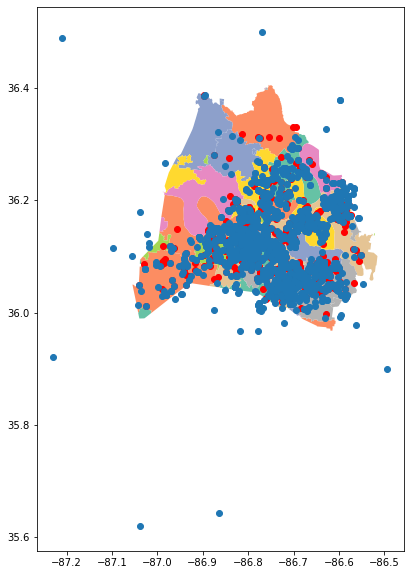

In [8]:
#quick plot to check work:

ax = zipcodes.plot(figsize = (8, 10), cmap = 'Set2')
cadd_derecho_geo.plot(ax = ax, color = 'red')
calls_derecho_geo.plot(ax = ax,);
plt.show();

In [9]:
#set area center for maps below, approx center of the city:

area_center = [36.2, -86.8]

In [10]:
# join derecho calls to zip data and check:

dcalls_zip = gpd.sjoin(calls_derecho_geo, zipcodes, op = 'within')
print(dcalls_zip.shape)
dcalls_zip.head()

(1425, 9)


,Time,CallTypeId,lat,lon,Cell Tower Address,geometry,index_right,zip,po_name
0,5/3/2020 16:30,911 Calls,36.247802,-86.716847,WIRELESS CALLER,POINT (-86.71685 36.24780),0,37115,MADISON
68,5/3/2020 16:44,911 Calls,36.265547,-86.736116,524 BOYDS HILLTOP DR - SW,POINT (-86.73612 36.26555),0,37115,MADISON
78,5/3/2020 16:46,911 Calls,36.250710,-86.689766,607E LARKIN SPRINGS RD - SW,POINT (-86.68977 36.25071),0,37115,MADISON
79,5/3/2020 16:46,911 Calls,36.259485,-86.678717,96 D VANDIVER DR - SECTOR S,POINT (-86.67872 36.25948),0,37115,MADISON
100,5/3/2020 16:51,911 Calls,36.253467,-86.730366,619 DUE WEST AVE. W - NE SECTOR,POINT (-86.73037 36.25347),0,37115,MADISON


In [11]:
#join derecho cadd data to zip data and check:

dcadd_zip = gpd.sjoin(cadd_derecho_geo, zipcodes, op = 'within')
print(dcadd_zip.shape)
dcadd_zip.head()

(625, 9)


,IncidentDate,Location,Latitude1,Longitude1,IncidentTypeDescription1,geometry,index_right,zip,po_name
0,5/3/2020 4:31:07 PM,901 KENWICK CT W,36.046877,-86.962526,ELECTRICAL HAZARD,POINT (-86.96253 36.04688),7,37221,NASHVILLE
1,5/3/2020 4:32:18 PM,8036 ARBOR DR,36.082491,-86.940680,ELECTRICAL HAZARD,POINT (-86.94068 36.08249),7,37221,NASHVILLE
17,5/3/2020 4:39:57 PM,8715 OLD HARDING PKE,36.012524,-87.024584,ELECTRICAL HAZARD,POINT (-87.02458 36.01252),7,37221,NASHVILLE
88,5/3/2020 5:12:40 PM,7205 MARK DR,36.065849,-86.928772,ELECTRICAL HAZARD,POINT (-86.92877 36.06585),7,37221,NASHVILLE
116,5/3/2020 5:25:03 PM,1651 CHICKERING RD,36.059848,-86.874532,ENTRAPMENT / TRAPPED,POINT (-86.87453 36.05985),7,37221,NASHVILLE


In [12]:
dcadd_zip = pd.DataFrame(dcadd_zip)

In [13]:
#change time column in cadd data to datetime format in order to manipulate:

dcadd_zip['IncidentDate'] = pd.to_datetime(dcadd_zip['IncidentDate'])
dcadd_zip.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 625 entries, 0 to 610
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   IncidentDate              625 non-null    datetime64[ns]
 1   Location                  625 non-null    object        
 2   Latitude1                 625 non-null    float64       
 3   Longitude1                625 non-null    float64       
 4   IncidentTypeDescription1  625 non-null    object        
 5   geometry                  625 non-null    geometry      
 6   index_right               625 non-null    int64         
 7   zip                       625 non-null    object        
 8   po_name                   625 non-null    object        
dtypes: datetime64[ns](1), float64(2), geometry(1), int64(1), object(4)
memory usage: 48.8+ KB


In [14]:
#narrow time to 8 pm or later to capture late calls only:

dcadd_zip = dcadd_zip[dcadd_zip['IncidentDate'] >= '05/03/2020 20:00:00']
print(dcadd_zip.info())
dcadd_zip.head()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 219 entries, 412 to 610
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   IncidentDate              219 non-null    datetime64[ns]
 1   Location                  219 non-null    object        
 2   Latitude1                 219 non-null    float64       
 3   Longitude1                219 non-null    float64       
 4   IncidentTypeDescription1  219 non-null    object        
 5   geometry                  219 non-null    geometry      
 6   index_right               219 non-null    int64         
 7   zip                       219 non-null    object        
 8   po_name                   219 non-null    object        
dtypes: datetime64[ns](1), float64(2), geometry(1), int64(1), object(4)
memory usage: 17.1+ KB
None


,IncidentDate,Location,Latitude1,Longitude1,IncidentTypeDescription1,geometry,index_right,zip,po_name
412,2020-05-03 20:03:01,250 NEW SAWYER BROWN RD,36.086361,-86.941623,ELECTRICAL HAZARD,POINT (-86.94162 36.08636),7,37221,NASHVILLE
420,2020-05-03 20:09:09,810 BELLEVUE RD,36.071842,-86.940561,CHEST PAIN - NOT ALERT,POINT (-86.94056 36.07184),7,37221,NASHVILLE
425,2020-05-03 20:13:32,7245 GREEN MEADOWS LN,36.067915,-86.936876,CITIZEN ASSIST NON MEDICAL,POINT (-86.93688 36.06791),7,37221,NASHVILLE
474,2020-05-03 20:48:45,7443 HUNTWICK TRL,36.096210,-86.982668,ELECTRICAL HAZARD,POINT (-86.98267 36.09621),7,37221,NASHVILLE
524,2020-05-03 21:38:22,6015 FIRE TOWER RD,36.115541,-86.963104,ELECTRICAL HAZARD,POINT (-86.96310 36.11554),7,37221,NASHVILLE


In [15]:
dcadd_zipcount = dcadd_zip.zip.value_counts().head(10)                                    
print(dcadd_zipcount)

37211    27
37205    20
37076    18
37214    16
37013    16
37215    13
37207    11
37204    11
37203    11
37217    11
Name: zip, dtype: int64


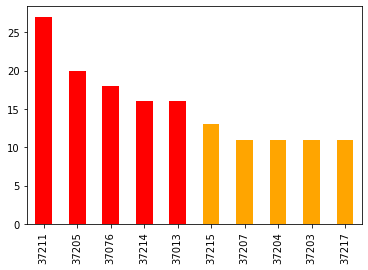

In [16]:
ax=dcadd_zipcount.plot.bar(x='zip', color=['red', 'red','red','red','red','orange','orange','orange','orange','orange']); 

#37211, 37205,37076,37013,37214

In [17]:
dcadd_incidents = dcadd_zip['IncidentTypeDescription1'].value_counts().head(5)
print(dcadd_incidents)

ELECTRICAL HAZARD                              96
GENERAL ALARM COMMERCIAL   INDUSTRIAL BUILD     7
SMOKE DETECTOR ALARM HOUSE                      5
CARBON MONOXIDE ALARM HOUSE                     5
UNKNOWN STATUS:                                 4
Name: IncidentTypeDescription1, dtype: int64


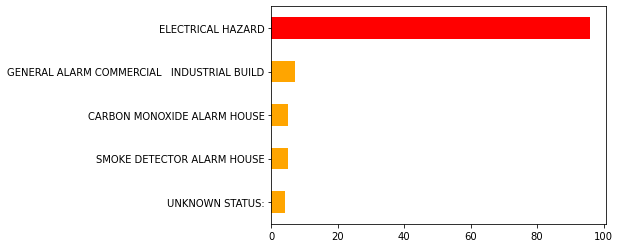

In [18]:
ax=dcadd_incidents.sort_values().plot.barh(x='IncidentTypeDescription1', color=['orange', 'orange','orange','orange','red']);

In [19]:
# Mapping derecho calls and cadd data together with zip codes:
# calls = red, dispatch = blue

calls_derecho_geo = calls_derecho_geo.dropna()


map_derecho = folium.Map(location = area_center, zoom_start = 11)

folium.GeoJson(zipcodes).add_to(map_derecho)

for row_index, row_values in calls_derecho_geo.iterrows() :
    loc = (row_values['lat'], row_values['lon']) 
    pop = str(row_values['Time']) 
    icon = folium.Icon(color='red', icon='phone', prefix='fa')
   
    marker = folium.Marker(
        location = loc, 
        popup = pop, 
        icon = icon)
    marker.add_to(map_derecho)

    
for row_index, row_values in cadd_derecho_geo.iterrows() :
    loc = (row_values['Latitude1'], row_values['Longitude1']) 
    pop = str(row_values['IncidentTypeDescription1']) + ': ' + str(row_values['IncidentDate'])
    icon = folium.Icon(color='blue', icon='none')
   
    marker = folium.Marker(
        location = loc, 
        popup = pop, 
        icon = icon)
    marker.add_to(map_derecho)
    
    
#map_derecho.save('../maps/map_derecho.html')
    
map_derecho

In [20]:
#read in short term rental permit dataset and check it out:

st_rentals_derecho = pd.read_csv('../data/Residential_Short_Term_Rental_Permits - Derecho.csv')
print(st_rentals_derecho.info())
st_rentals_derecho.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3630 entries, 0 to 3629
Data columns (total 10 columns):
 #   Column                      Non-Null Count  Dtype 
---  ------                      --------------  ----- 
 0   Permit #                    3630 non-null   object
 1   Permit Subtype Description  3630 non-null   object
 2   Permit Status               3630 non-null   object
 3   Date Issued                 3603 non-null   object
 4   Expiration Date             3630 non-null   object
 5   Address                     3630 non-null   object
 6   City                        3629 non-null   object
 7   State                       3629 non-null   object
 8   ZIP                         3630 non-null   int64 
 9   Mapped Location             3630 non-null   object
dtypes: int64(1), object(9)
memory usage: 283.7+ KB
None


,Permit #,Permit Subtype Description,Permit Status,Date Issued,Expiration Date,Address,City,State,ZIP,Mapped Location
0,201512359,Short Term Rental - Non-Owner Occupied,ISSUED,4/6/2015 0:00,4/6/2021 0:00,925 DOUGLAS AVE,NASHVILLE,TN,37206,"925 DOUGLAS AVE\nNASHVILLE, TN 37206\n(36.1929..."
1,201512400,Short Term Rental - Non-Owner Occupied,ISSUED,4/6/2015 0:00,4/6/2021 0:00,1019 MANSFIELD ST,NASHVILLE,TN,37206,"1019 MANSFIELD ST\nNASHVILLE, TN 37206\n(36.18..."
2,201512439,Short Term Rental - Non-Owner Occupied,ISSUED,4/6/2015 0:00,4/6/2021 0:00,219 TREUTLAND AVE,NASHVILLE,TN,37207,"219 TREUTLAND AVE\nNASHVILLE, TN 37207\n(36.18..."
3,201512507,Short Term Rental - Non-Owner Occupied,ISSUED,4/6/2015 0:00,4/6/2021 0:00,1004 W EASTLAND AVE,NASHVILLE,TN,37206,"1004 W EASTLAND AVE\nNASHVILLE, TN 37206\n(36...."
4,201512640,Short Term Rental - Non-Owner Occupied,ISSUED,4/7/2015 0:00,4/7/2021 0:00,1300 EDGEWOOD PL,NASHVILLE,TN,37206,"1300 EDGEWOOD PL\nNASHVILLE, TN 37206\n(36.184..."


In [21]:
#split lat and lng out of Mapped Location column:

#step 1:
MapLocSplit = st_rentals_derecho["Mapped Location"].str.split("(", n = -1, expand = True) 
st_rentals_derecho["Mapped Address"]= MapLocSplit[0] 
st_rentals_derecho["Lat Lng"]= MapLocSplit[1] 
  
#step 2:
st_rentals_derecho.dropna(inplace = True) 
LatLngSplit = st_rentals_derecho["Lat Lng"].str.split(",", n = 1, expand = True) 
st_rentals_derecho["Lat"]= LatLngSplit[0] 
st_rentals_derecho["Lng"]= LatLngSplit[1] 
st_rentals_derecho.drop(columns =["Mapped Location", "Mapped Address", "Lat Lng"], inplace = True) 
  
#step 3:
st_rentals_derecho['Lng'] = st_rentals_derecho['Lng'].str.slice(0, -1)

    
print(st_rentals_derecho.info())
st_rentals_derecho

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3498 entries, 0 to 3602
Data columns (total 11 columns):
 #   Column                      Non-Null Count  Dtype 
---  ------                      --------------  ----- 
 0   Permit #                    3498 non-null   object
 1   Permit Subtype Description  3498 non-null   object
 2   Permit Status               3498 non-null   object
 3   Date Issued                 3498 non-null   object
 4   Expiration Date             3498 non-null   object
 5   Address                     3498 non-null   object
 6   City                        3498 non-null   object
 7   State                       3498 non-null   object
 8   ZIP                         3498 non-null   int64 
 9   Lat                         3498 non-null   object
 10  Lng                         3498 non-null   object
dtypes: int64(1), object(10)
memory usage: 327.9+ KB
None


,Permit #,Permit Subtype Description,Permit Status,Date Issued,Expiration Date,Address,City,State,ZIP,Lat,Lng
0,201512359,Short Term Rental - Non-Owner Occupied,ISSUED,4/6/2015 0:00,4/6/2021 0:00,925 DOUGLAS AVE,NASHVILLE,TN,37206,36.192988,-86.74772
1,201512400,Short Term Rental - Non-Owner Occupied,ISSUED,4/6/2015 0:00,4/6/2021 0:00,1019 MANSFIELD ST,NASHVILLE,TN,37206,36.181534,-86.751596
2,201512439,Short Term Rental - Non-Owner Occupied,ISSUED,4/6/2015 0:00,4/6/2021 0:00,219 TREUTLAND AVE,NASHVILLE,TN,37207,36.180211,-86.770231
3,201512507,Short Term Rental - Non-Owner Occupied,ISSUED,4/6/2015 0:00,4/6/2021 0:00,1004 W EASTLAND AVE,NASHVILLE,TN,37206,36.184112,-86.752456
4,201512640,Short Term Rental - Non-Owner Occupied,ISSUED,4/7/2015 0:00,4/7/2021 0:00,1300 EDGEWOOD PL,NASHVILLE,TN,37206,36.184544,-86.745551
...,...,...,...,...,...,...,...,...,...,...,...
3598,2020009866,Short Term Rental � Multifamily,ISSUED,4/21/2020 0:00,4/21/2021 0:00,612 21ST AVE N 312,NASHVILLE,TN,37203,36.158544,-86.80639
3599,2020016487,Short Term Rental � Multifamily,ISSUED,4/27/2020 0:00,4/27/2021 0:00,2111 BELCOURT AVE 407,NASHVILLE,TN,37212,36.136725,-86.801837
3600,2020017328,Short Term Rental � Multifamily,ISSUED,4/27/2020 0:00,4/27/2021 0:00,1520 16TH AVE S 10,NASHVILLE,TN,37212,36.139098,-86.793955
3601,2020017276,Short Term Rental � Multifamily,ISSUED,4/27/2020 0:00,4/27/2021 0:00,1520 16TH AVE S 6,NASHVILLE,TN,37212,36.13912,-86.793951


In [22]:
#change short term rentals data into geo:

st_rentals_derecho['geometry'] = st_rentals_derecho.apply(lambda x: Point((float(x.Lng), 
                                                         float(x.Lat))), 
                                        axis=1)


strentalsderecho_geo = gpd.GeoDataFrame(st_rentals_derecho, 
                           crs = zipcodes.crs, 
                           geometry = st_rentals_derecho['geometry'])

print(strentalsderecho_geo.crs)
strentalsderecho_geo.head(3)

epsg:4326


,Permit #,Permit Subtype Description,Permit Status,Date Issued,Expiration Date,Address,City,State,ZIP,Lat,Lng,geometry
0,201512359,Short Term Rental - Non-Owner Occupied,ISSUED,4/6/2015 0:00,4/6/2021 0:00,925 DOUGLAS AVE,NASHVILLE,TN,37206,36.192988,-86.74772,POINT (-86.74772 36.19299)
1,201512400,Short Term Rental - Non-Owner Occupied,ISSUED,4/6/2015 0:00,4/6/2021 0:00,1019 MANSFIELD ST,NASHVILLE,TN,37206,36.181534,-86.751596,POINT (-86.75160 36.18153)
2,201512439,Short Term Rental - Non-Owner Occupied,ISSUED,4/6/2015 0:00,4/6/2021 0:00,219 TREUTLAND AVE,NASHVILLE,TN,37207,36.180211,-86.770231,POINT (-86.77023 36.18021)


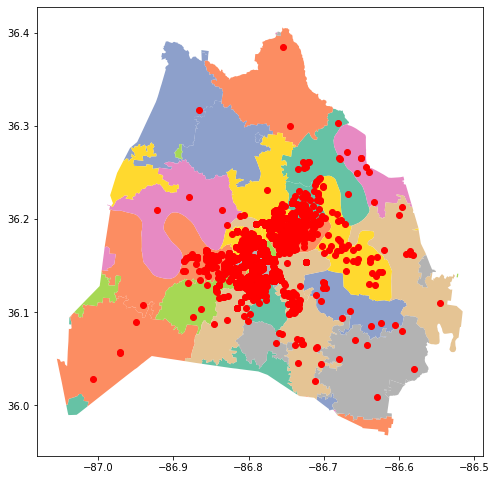

In [23]:
ax = zipcodes.plot(figsize = (8, 10), cmap = 'Set2')
strentalsderecho_geo.plot(ax = ax, color = 'red')
#calls_derecho_geo.plot(ax = ax,);
plt.show();

In [24]:
#could subset on zip code, but taking it out for now:

#strentalsderecho_geo = strentalsderecho_geo[strentalsderecho_geo.ZIP.isin([37209, 37208, 37203, 37206, 37214, 37219, 37210, 37207, 37076])]
#strentalstorn_geo.ZIP.value_counts()

In [25]:
#change time column to datetimeformat in order to manipulate:

calls_derecho_geo['Time'] = pd.to_datetime(calls_derecho_geo['Time'])

In [26]:
#narrow time to 8 pm or later to capture late calls only:

derecho_sw_geo = calls_derecho_geo[calls_derecho_geo['Time'] >= '2020-05-03 20:00:00']
print(derecho_sw_geo.info())
derecho_sw_geo.head()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 494 entries, 1042 to 1547
Data columns (total 6 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   Time                494 non-null    datetime64[ns]
 1   CallTypeId          494 non-null    object        
 2   lat                 494 non-null    float64       
 3   lon                 494 non-null    float64       
 4   Cell Tower Address  494 non-null    object        
 5   geometry            494 non-null    geometry      
dtypes: datetime64[ns](1), float64(2), geometry(1), object(2)
memory usage: 27.0+ KB
None


,Time,CallTypeId,lat,lon,Cell Tower Address,geometry
1042,2020-05-03 20:00:00,911 Calls,36.151339,-86.872737,WIRELESS CALLER,POINT (-86.87274 36.15134)
1043,2020-05-03 20:00:00,911 Calls,36.049168,-86.690798,WIRELESS CALLER,POINT (-86.69080 36.04917)
1044,2020-05-03 20:01:00,911 Calls,36.069231,-86.766350,4813 TROUSDALE DR - W,POINT (-86.76635 36.06923)
1045,2020-05-03 20:01:00,911 Calls,36.067387,-86.631485,2747 C MURFREESBORO PKE - E Sector,POINT (-86.63148 36.06739)
1046,2020-05-03 20:01:00,911 Calls,36.291468,-86.703007,WIRELESS CALLER,POINT (-86.70301 36.29147)


In [27]:
#change time column in cadd data to datetime format in order to manipulate:

cadd_derecho_geo['IncidentDate'] = pd.to_datetime(cadd_derecho_geo['IncidentDate'])

#narrow time to 8 pm or later to capture late calls only:

cadd_derecho_sw_geo = cadd_derecho_geo[cadd_derecho_geo['IncidentDate'] >= '05/03/2020 8:00:00 PM']
cadd_derecho_sw_geo.head()

,IncidentDate,Location,Latitude1,Longitude1,IncidentTypeDescription1,geometry
408,2020-05-03 20:00:04,487 ELLENWOOD DR,36.058035,-86.733791,ELECTRICAL HAZARD,POINT (-86.73379 36.05804)
409,2020-05-03 20:00:32,3531 HUNTLAND DR,36.274720,-86.842008,DIFFICULTY SPEAKING BETWEEN BREATHS,POINT (-86.84201 36.27472)
410,2020-05-03 20:00:35,6009 HAWKDALE DR,36.029022,-86.714328,ABNORMAL BREATHING,POINT (-86.71433 36.02902)
411,2020-05-03 20:02:45,5017 MAYWOOD DR,36.070287,-86.757398,ELECTRICAL HAZARD,POINT (-86.75740 36.07029)
412,2020-05-03 20:03:01,250 NEW SAWYER BROWN RD,36.086361,-86.941623,ELECTRICAL HAZARD,POINT (-86.94162 36.08636)


In [28]:
# Mapping LATE tornado calls and cadd data together with zip codes:
# calls = red, dispatch = blue

derecho_sw_geo = derecho_sw_geo.dropna()
cadd_derecho_sw_geo = cadd_derecho_sw_geo.dropna()

map_derecho_sw = folium.Map(location = area_center, zoom_start = 11)

folium.GeoJson(zipcodes).add_to(map_derecho_sw)

for row_index, row_values in derecho_sw_geo.iterrows() :
    loc = (row_values['lat'], row_values['lon']) 
    pop = str(row_values['Time']) 
    icon = folium.Icon(color='red', icon='phone', prefix='fa')
   
    marker = folium.Marker(
        location = loc, 
        popup = pop, 
        icon = icon)
    marker.add_to(map_derecho_sw)

    
for row_index, row_values in cadd_derecho_sw_geo.iterrows() :
    loc = (row_values['Latitude1'], row_values['Longitude1']) 
    pop = str(row_values['IncidentTypeDescription1']) + ': ' + str(row_values['IncidentDate'])
    icon = folium.Icon(color='blue', icon='none')
   
    marker = folium.Marker(
        location = loc, 
        popup = pop, 
        icon = icon)
    marker.add_to(map_derecho_sw)
    
    
map_derecho_sw.save('../maps/map_derecho_sw.html')
    
map_derecho_sw

# Mapping derecho calls and Short Term Rentals with zip codes:
# calls = red, ST rentals = blue

derecho_sw_geo = derecho_sw_geo.dropna()


map_derecho_rentals = folium.Map(location = area_center, zoom_start = 11)

folium.GeoJson(zipcodes).add_to(map_derecho_rentals)

for row_index, row_values in derecho_sw_geo.iterrows() :
    loc = (row_values['lat'], row_values['lon']) 
    pop = str(row_values['Time']) 
    icon = folium.Icon(color='red', icon='phone', prefix='fa')
   
    marker = folium.Marker(
        location = loc, 
        popup = pop, 
        icon = icon)
    marker.add_to(map_derecho_rentals)

    
for row_index, row_values in strentalsderecho_geo.iterrows() :
    loc = (row_values['Lat'], row_values['Lng']) 
    #pop = str(row_values['Lat']) + ': ' + str(row_values['Lng'])
    icon = folium.Icon(color='blue', icon='home', prefix='fa')
   
    marker = folium.Marker(
        location = loc, 
        #popup = pop, 
        icon = icon)
    marker.add_to(map_derecho_rentals)
    
    
#map_derecho_rentals.save('../maps/map_derecho_rentals.html')
    
map_derecho_rentals

In [29]:
# same map as above but with rentals as a cluster to make it move faster:


derecho_sw_geo = derecho_sw_geo.dropna()


cluster_map_derecho_rentals = folium.Map(location = area_center, zoom_start = 11)

marker_cluster = MarkerCluster().add_to(cluster_map_derecho_rentals)

folium.GeoJson(zipcodes).add_to(cluster_map_derecho_rentals)

for row_index, row_values in derecho_sw_geo.iterrows() :
    loc = (row_values['lat'], row_values['lon']) 
    pop = str(row_values['Time']) 
    icon = folium.Icon(color='red', icon='phone', prefix='fa')
   
    marker = folium.Marker(
        location = loc, 
        popup = pop, 
        icon = icon)
    marker.add_to(cluster_map_derecho_rentals)

    
for row_index, row_values in strentalsderecho_geo.iterrows() :
    loc = (row_values['Lat'], row_values['Lng']) 
    #pop = str(row_values['Lat']) + ': ' + str(row_values['Lng'])
    icon = folium.Icon(color='blue', icon='home', prefix='fa')
   
    marker = folium.Marker(
        location = loc, 
        #popup = pop, 
        icon = icon)
    marker.add_to(marker_cluster)
    
    
#cluster_map_derecho_rentals.save('../maps/cluster_map_derecho_rentals.html')
    
cluster_map_derecho_rentals

In [30]:
#looking at cadd data to see what to use for commercial designation:

cadd_derecho.IncidentTypeDescription1.value_counts().head(20)

ELECTRICAL HAZARD                              370
GENERAL ALARM COMMERCIAL   INDUSTRIAL BUILD     23
MVA INJURIES:                                    8
SMALL OUTSIDE FIRE                               6
UNKNOWN STATUS:                                  6
CARBON MONOXIDE ALARM HOUSE                      6
SMALL BUILDING INVESTIGATION                     6
GENERAL ALARM APARTMENT                          5
DIFFICULTY SPEAKING BETWEEN BREATHS COPD         5
SMOKE DETECTOR ALARM HOUSE                       5
ELECTRICAL HAZARD - WIRES DOWN                   5
RESIDENTIAL FIRE                                 4
ENTRAPMENT UNKNOWN SITUATION                     4
UNKNOWN STATUS                                   4
SICK PERSON: ABNORMAL BREATHING                  4
MVA OTHER HAZARDS                                4
SICK PERSON: ALTERED LEVEL OF CONSCIOUSNESS      4
DIFFICULTY SPEAKING BETWEEN BREATHS              4
ENTRAPMENT / TRAPPED                             4
ABNORMAL BREATHING             

In [31]:
#sub setting for commerical/business:

derecho_business = cadd_derecho[cadd_derecho['IncidentTypeDescription1'].str.contains('LARGE') |  #use 'BUILDING' instead?
                                cadd_derecho['IncidentTypeDescription1'].str.contains('INDUSTRIAL') | 
                                cadd_derecho['IncidentTypeDescription1'].str.contains('COMMERCIAL')]

derecho_business.IncidentTypeDescription1.value_counts().head(20)

GENERAL ALARM COMMERCIAL   INDUSTRIAL BUILD                 23
PULL STATION ALARM COMMERCIAL   INDUSTRIAL BUILD             3
WATERFLOW ALARM COMMERCIAL COMMERCIAL   INDUSTRIAL BUILD     3
SMOKE DETECTOR ALARM COMMERCIAL   INDUSTRIAL BUILD           2
CARBON MONOXIDE ALARM COMMERCIAL   INDUSTRIAL BUILD          1
Name: IncidentTypeDescription1, dtype: int64

In [32]:
derecho_business.head(3)

,IncidentDate,Location,Latitude1,Longitude1,IncidentTypeDescription1,geometry
8,2020-05-03 16:36:42,3000 POSTON AV,36.145332,-86.815356,GENERAL ALARM COMMERCIAL INDUSTRIAL BUILD,POINT (-86.81536 36.14533)
16,2020-05-03 16:39:33,2106 FAIRFAX AV,36.134384,-86.802149,GENERAL ALARM COMMERCIAL INDUSTRIAL BUILD,POINT (-86.80215 36.13438)
18,2020-05-03 16:40:05,188 THOMPSON LN,36.110859,-86.739307,GENERAL ALARM COMMERCIAL INDUSTRIAL BUILD,POINT (-86.73931 36.11086)


In [33]:
# Mapping derecho calls and Commerical buildings with zip codes:
# calls = red, commerical = blue

derecho_sw_geo = derecho_sw_geo.dropna()


map_derecho_business = folium.Map(location = area_center, zoom_start = 11)

folium.GeoJson(zipcodes, popup=folium.GeoJsonPopup(fields=['zip'], labels=False)).add_to(map_derecho_business)

for row_index, row_values in derecho_sw_geo.iterrows() :
    loc = (row_values['lat'], row_values['lon']) 
    pop = str(row_values['Time']) 
    icon = folium.Icon(color='red', icon='phone', prefix='fa')
   
    marker = folium.Marker(
        location = loc, 
        popup = pop, 
        icon = icon)
    marker.add_to(map_derecho_business)

    
for row_index, row_values in derecho_business.iterrows() :
    loc = (row_values['Latitude1'], row_values['Longitude1']) 
    pop = str(row_values['IncidentDate']) + ': ' + str(row_values['IncidentTypeDescription1']) 
    icon = folium.Icon(color='blue', icon='building', prefix='fa')

    marker = folium.Marker(
        location = loc, 
        popup = pop, 
        icon = icon)
    marker.add_to(map_derecho_business)
    
    
#map_derecho_business.save('../maps/map_derecho_business.html')
    
map_derecho_business

In [34]:
#read in data from metro website for May 3:

metro_calls_derecho = pd.read_csv('../data/May Metro_Nashville_Police_Department_Calls_for_Service.csv')

metro_calls_derecho.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4931 entries, 0 to 4930
Data columns (total 19 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Event Number                4931 non-null   object 
 1   Call Received               4931 non-null   object 
 2   Complaint Number            292 non-null    float64
 3   Shift                       0 non-null      float64
 4   Tencode                     4931 non-null   int64  
 5   Tencode Description         0 non-null      float64
 6   Tencode Suffix              3939 non-null   object 
 7   Tencode Suffix Description  3527 non-null   object 
 8   Disposition Code            4931 non-null   object 
 9   Disposition Description     0 non-null      float64
 10  Block                       929 non-null    float64
 11  Street Name                 1026 non-null   object 
 12  Unit Dispatched             4399 non-null   object 
 13  Sector                      4082 

In [35]:
#change time column to datetime format in order to manipulate:

metro_calls_derecho['Call Received'] = pd.to_datetime(metro_calls_derecho['Call Received'])


#narrow time to 8 pm or later to capture late calls only:

metro_calls_derecho_sw = metro_calls_derecho[metro_calls_derecho['Call Received'] >= '05/03/2020 20:00:00']
metro_calls_derecho_sw.head()

,Event Number,Call Received,Complaint Number,Shift,Tencode,Tencode Description,Tencode Suffix,Tencode Suffix Description,Disposition Code,Disposition Description,Block,Street Name,Unit Dispatched,Sector,Zone,RPA,Latitude,Longitude,Mapped Location
1904,PD202000358388,2020-05-03 20:00:38,NaN,NaN,87,NaN,W,WARRANT ASSISTANCE ESCORT,5,NaN,NaN,SHUTE LN,525B,HERMIT,525,9717.0,36.231,-86.611,POINT (-86.611 36.231)
1905,PD202000358389,2020-05-03 20:02:50,NaN,NaN,87,NaN,W,WARRANT ASSISTANCE ESCORT,4,NaN,NaN,NaN,810C,MT,833,8613.0,NaN,NaN,NaN
1906,PD202000358390,2020-05-03 20:03:05,NaN,NaN,87,NaN,W,WARRANT ASSISTANCE ESCORT,4,NaN,NaN,NaN,320B,W,125,4813.0,NaN,NaN,NaN
1907,PD202000358391,2020-05-03 20:03:55,NaN,NaN,87,NaN,P,PROGRESS,4,NaN,NaN,NaN,101,N,625,3173.0,NaN,NaN,NaN
1908,PD202000358392,2020-05-03 20:03:59,NaN,NaN,45,NaN,P,PROGRESS,4,NaN,NaN,NaN,830B,MT,831K,NaN,NaN,NaN,NaN


In [36]:
metro_calls_derecho.Tencode.value_counts().head(10)

87    1378
43     912
96     716
71     277
44     230
15     188
93     181
70     166
45     138
50     135
Name: Tencode, dtype: int64

In [37]:
metro_calls_derecho_Tencodes_sw = metro_calls_derecho_sw.Tencode.value_counts().head(10)
print(metro_calls_derecho_Tencodes_sw)

87    748
43    605
96    394
71    167
44    165
93    153
15    129
70    107
50     84
45     77
Name: Tencode, dtype: int64


Tencodes: 
87 Safety Hazard,
43 Want Officer for Investigation / Assistance,
96 Business Check,

71 Burglary - Non-Residence,
44 Disorderly Person,
15 Community Policing Activity,
93 Traffic Violation,
70 Burglary - Residence,
45 Vehicle Accident - Property Damage,
50 Theft

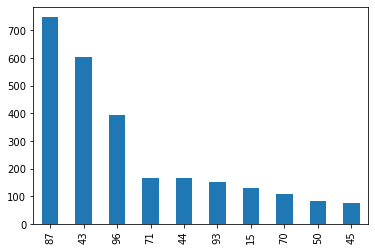

In [38]:
ax=metro_calls_derecho_Tencodes_sw.plot.bar(x='Tencodes');